In [1]:
import scipy.stats
import random
import math
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import json
import numpy as np
import pickle
import csv
import itertools
import pandas as pd


##Background:
####Subset of LINCS perturbagens we are using:

1. We mapped LINCS small molecules to drugbank (there are ~20,000 LINCS small molecules tested so far)
2. Matches were made to 1232 drugbank drugs (out of ~7000 drugbank drugs), sometimes
   multiple perturbagens match to the same drugbank drug
3. Out of these 1232 drugbank drugs, 899 of them are approved drugs (there are 1600 total approved
   drugbank drugs)

####LINCS provides three levels of gene sets: L1000, is_bing, and non_bing:

L1000 = Measured directly<br>
is_bing = Set of high fidelity imputed genes<br>
non_bing = Set of low fidelity imputed genes<br>
<br>
LINCS office hours members told us that is_bing would be a good set of genes to start with.

####LINCS signatures:

LINCS signatures receive the gold level if they are replicable and distinct. We have only been using the gold signatures for analysis.

##Central question: How to define set of genes affected by a drug

Things to consider:
1. Number of LINCS perturbagens mapped to each drugbank drug varies between 1 and 7 
2. Number of gold signatures per perturbagen varies between 0 and ~ 1000
3. There are 72 cell lines represented in the gold signatures
4. Signatures either represent the profile 6 hours post treatment or 24 hours post treatment



In [3]:
total_dict = pickle.load(open('/Users/leobrueggeman/GitHub/LINCS/final_dict.dat', "rb" ) )

In [268]:
%matplotlib inline
matplotlib.rcParams['savefig.dpi'] = 2 * matplotlib.rcParams['savefig.dpi']

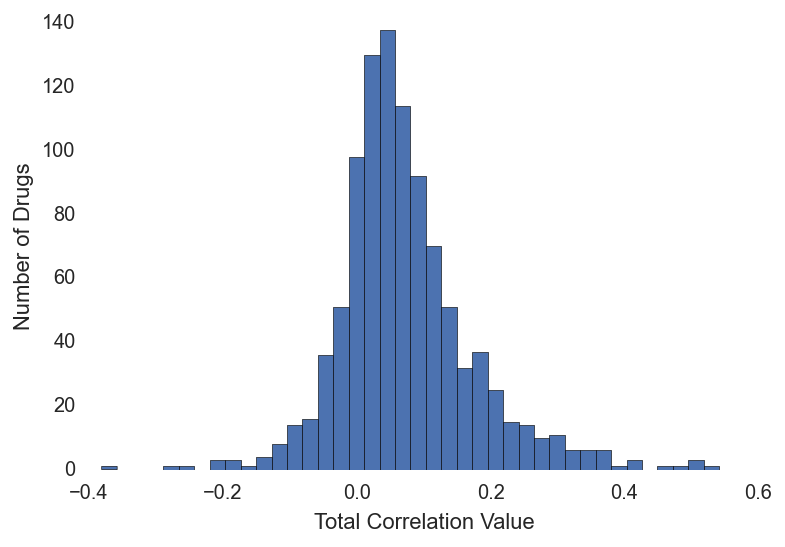

In [122]:
# Distribution of total corr values
total_corr_list = []
for element in total_dict:
    total_corr_list.append(total_dict[element]['total_corr'])
total_corr_list = [x for x in total_corr_list if x != 'NA']
plt.hist(total_corr_list, 40);
plt.ylabel('Number of Drugs');
plt.xlabel('Total Correlation Value');

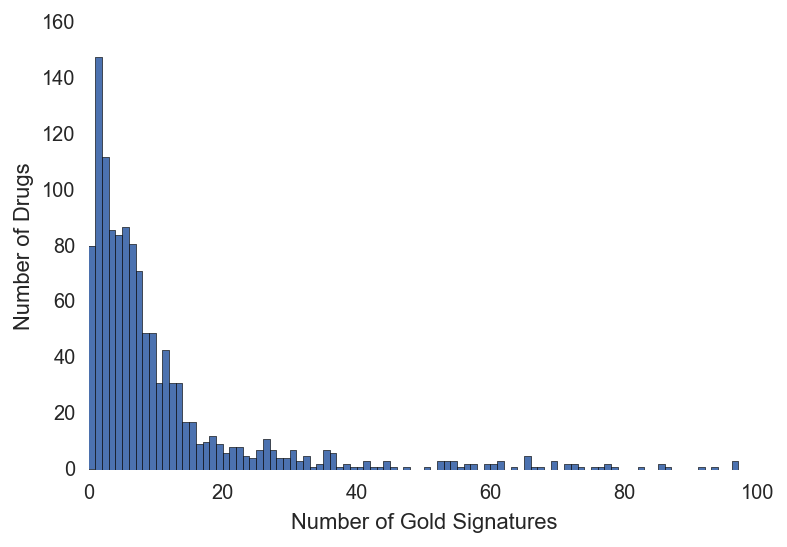

In [123]:
# Distribution of number of sig_id_experiments per drugbank drug
sig_count = []
for element in total_dict:
    sig_count.append(len(total_dict[element]['sig_id_gold']))
    
plt.xlim([0,100])
plt.hist(sig_count, bins=np.arange(150));
plt.ylabel('Number of Drugs');
plt.xlabel('Number of Gold Signatures');

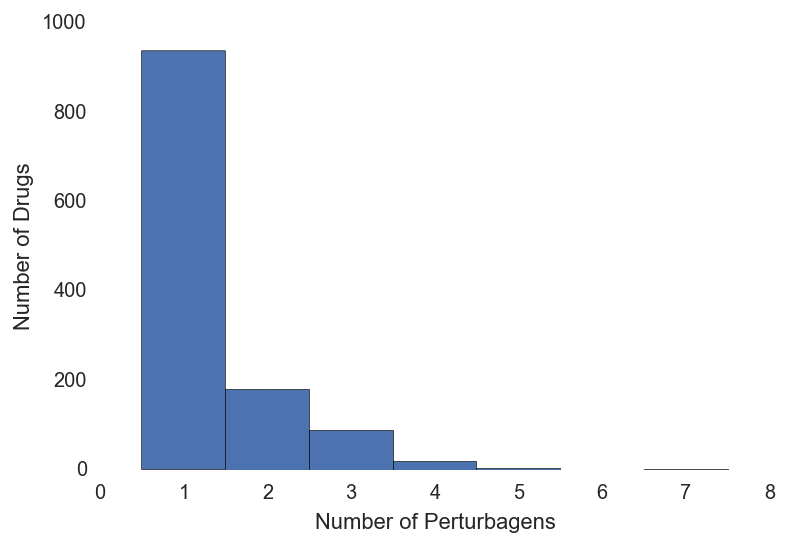

In [173]:
# Distribution of number of pert_ids per drugbank drug
pert_count = []
for element in total_dict:
    i = 0
    for key in total_dict[element]:
        if key.startswith('BRD'):
            i += 1
    pert_count.append(i)

plt.hist(pert_count, bins=np.arange(1,9) - 0.5);
plt.ylabel('Number of Drugs');
plt.xlabel('Number of Perturbagens');

#Analysis of multiple perturbagen drugbank drugs

##Unrelated perturbagens

In [86]:
key_list = total_dict.keys()
keep_key_list = []
for element in key_list:
    if len(total_dict[element]['pert_id']) == 1 and len(total_dict[element]['sig_id_gold']) != 0:
        keep_key_list.append(element)
rand_list_1 = random.sample(keep_key_list, 200)
rand_list_2 = random.sample(keep_key_list, 200)
        
final_unrel_pert_list = []
for i in range(len(rand_list_1)):
    print(i)
    temp_matrix = []
    db_1 = rand_list_1[i]
    db_2 = rand_list_2[i]
    if type(total_dict[db_1]['cons_expr_sig'][0]) == list:
        merged_1 = list(itertools.chain.from_iterable(total_dict[db_1]['cons_expr_sig']))
    else:
        merged_1 = total_dict[db_1]['cons_expr_sig']
    if type(total_dict[db_2]['cons_expr_sig'][0]) == list:
        merged_2 = list(itertools.chain.from_iterable(total_dict[db_2]['cons_expr_sig']))
    else:
        merged_2 = total_dict[db_2]['cons_expr_sig']
    temp_matrix.append(merged_1)
    temp_matrix.append(merged_2)
    try:
        corr_value = matrix_to_corr_matrix(temp_matrix)
    except: 
        print(db_1)
        print(db_2)
        print(temp_matrix)
        break
    final_unrel_pert_list.append(['Unrelated', 'NA', corr_value])
unrel_df = pd.DataFrame(final_unrel_pert_list, columns=['Type', 'Pert_Number', 'Corr_Value'])
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


In [104]:
final_df = unrel_df.append(merged_df)
final_df = final_df.append(identical_df)

In [105]:
final_df

,Type,Pert_Number,Corr_Value
0,Unrelated,NA,-0.184278
1,Unrelated,NA,0.201385
2,Unrelated,NA,0.060491
3,Unrelated,NA,0.492546
4,Unrelated,NA,0.407651
5,Unrelated,NA,-0.142679
6,Unrelated,NA,-0.241924
7,Unrelated,NA,0.261527
8,Unrelated,NA,-0.035837
9,Unrelated,NA,-0.122354


##Merged perturbagens

In [92]:
import os
os.chdir("/Users/leobrueggeman/GitHub/LINCS/l1ktools/python")
import cmap.io.gct as gct 
path_to_bing_file = '/Users/leobrueggeman/GitHub/LINCS/isbing_pr_genelist.json'
json_bing = json.loads(open(path_to_bing_file).read())
bing_list = list(json_bing)
 

In [96]:
final_merged_pert_corr_list = []

for element in total_dict:
    print(element)
    temp_cons_matrices = []
    pert_list = total_dict[element]['pert_id']
    keep_pert_list = []
    false_multiple_list = []
    # drop entries from pert_list which have no sig_gold_ids
    for entry in pert_list:
        if len(total_dict[element][entry]['sig_id_gold']) != 0:
            keep_pert_list.append(entry)
    if len(keep_pert_list) <= 1:
        false_multiple_list.append(element)
        continue
    if len(keep_pert_list) == 2:
        for part in keep_pert_list:
            temp_sig_gold = total_dict[element][part]['sig_id_gold']
            if len(temp_sig_gold) == 1:
                temp_matrix = cid_to_matrix(temp_sig_gold)
                temp_cons_matrices.append(list(temp_matrix.flatten()))
                continue
            if len(temp_sig_gold) == 2:
                temp_matrix = cid_to_matrix(temp_sig_gold)
                temp_cons_matrix = sig_corr_value_to_expr_sig(temp_matrix, 0.5)
                temp_cons_matrices.append(temp_cons_matrix)
                continue
            temp_matrix = cid_to_matrix(temp_sig_gold)
            temp_corr_matrix = matrix_to_corr_matrix(temp_matrix)
            temp_sig_corr_value, temp_total_corr = corr_matrix_to_sig_corr_value_and_total_corr(temp_corr_matrix)
            temp_cons_expr_sig = sig_corr_value_to_expr_sig(temp_matrix, temp_sig_corr_value)
            temp_cons_matrices.append(temp_cons_expr_sig)
        corr_matrix = matrix_to_corr_matrix(temp_cons_matrices)
        final_merged_pert_corr_list.append(['Merged', 2, corr_matrix])
        continue
    for key in keep_pert_list:
        temp_sig_gold = total_dict[element][key]['sig_id_gold']
        if len(temp_sig_gold) == 1:
            temp_matrix = cid_to_matrix(temp_sig_gold)
            temp_cons_matrices.append(list(temp_matrix.flatten()))
            continue
        if len(temp_sig_gold) == 2:
            temp_matrix = cid_to_matrix(temp_sig_gold)
            temp_cons_matrix = sig_corr_value_to_expr_sig(temp_matrix, 0.5)
            temp_cons_matrices.append(temp_cons_matrix)
            continue
        temp_matrix = cid_to_matrix(temp_sig_gold)
        temp_corr_matrix = matrix_to_corr_matrix(temp_matrix)
        temp_sig_corr_value , temp_total_corr = corr_matrix_to_sig_corr_value_and_total_corr(temp_corr_matrix)
        temp_cons_expr_sig = sig_corr_value_to_expr_sig(temp_matrix, temp_sig_corr_value)
        temp_cons_matrices.append(temp_cons_expr_sig)
    corr_matrix = matrix_to_corr_matrix(temp_cons_matrices)
    corr_len = len(corr_matrix)
    for i in range(corr_len):
        for j in range(i+1, corr_len):
            final_merged_pert_corr_list.append(['Merged',len(keep_pert_list),corr_matrix[i][j]])
        
merged_df = pd.DataFrame(final_merged_pert_corr_list, columns=['Type', 'Pert_Number', 'Corr_Value'])
    

DB04179
DB01418
DB00150
DB00742
DB04574
                                                                                DB01413
DB01412
DB04175
DB04177
                                                                                DB00904
DB00774
DB00443
                                                                                DB00957
                                                                                DB04573
                                                                                DB00442
DB05318
                                                                                DB00862
DB06999
DB00162
                                                                                DB00967
DB01099
DB01098
DB01407
DB01095
                                                                                DB01097
DB00679
DB01091
DB01090
DB01092
                                                                                DB00892
DB01259
                                

In [209]:
total_dict['DB00442']['corr_matrix']

array([[ 1.        ,  0.18634886,  0.22794068,  0.27632579, -0.09075914],
       [ 0.18634886,  1.        ,  0.14383553,  0.15850218, -0.05427977],
       [ 0.22794068,  0.14383553,  1.        ,  0.13136547, -0.09824567],
       [ 0.27632579,  0.15850218,  0.13136547,  1.        ,  0.04232702],
       [-0.09075914, -0.05427977, -0.09824567,  0.04232702,  1.        ]])

##Identical Perturbagens

In [99]:
final_ident_corr_pert_list = []
new_dict = random.sample(total_dict.keys(), 300)
for key in new_dict:
    temp_cons_matrices = []
    print key
    if len(total_dict[key]['pert_id']) != 1:
        continue
    if len(total_dict[key]['sig_id_gold']) < 2:
        continue
    sig_list = total_dict[key]['sig_id_gold']
    group_1 = []
    group_2 = []
    #break sig_list into two groups
    for i in range(len(sig_list)):
        if i%2 != 0:
            group_1.append(sig_list[i])
        else:
            group_2.append(sig_list[i])
    if len(group_1) == 1:
        temp_matrix = cid_to_matrix(group_1)
        temp_cons_matrices.append(list(temp_matrix.flatten()))
    if len(group_1) == 2:
        temp_matrix = cid_to_matrix(group_1)
        temp_cons_matrix = sig_corr_value_to_expr_sig(temp_matrix, 0.5)
        temp_cons_matrices.append(temp_cons_matrix)
    if len(group_1) > 2:
        temp_matrix = cid_to_matrix(group_1)
        temp_corr_matrix = matrix_to_corr_matrix(temp_matrix)
        temp_sig_corr_value, temp_total_corr = corr_matrix_to_sig_corr_value_and_total_corr(temp_corr_matrix)
        temp_cons_expr_sig = sig_corr_value_to_expr_sig(temp_matrix, temp_sig_corr_value)
        temp_cons_matrices.append(temp_cons_expr_sig)
    if len(group_2) == 1:
        temp_matrix = cid_to_matrix(group_2)
        temp_cons_matrices.append(list(temp_matrix.flatten()))
    if len(group_2) == 2:
        temp_matrix = cid_to_matrix(group_2)
        temp_cons_matrix = sig_corr_value_to_expr_sig(temp_matrix, 0.5)
        temp_cons_matrices.append(temp_cons_matrix)
    if len(group_2) > 2:
        temp_matrix = cid_to_matrix(group_2)
        temp_corr_matrix = matrix_to_corr_matrix(temp_matrix)
        temp_sig_corr_value, temp_total_corr = corr_matrix_to_sig_corr_value_and_total_corr(temp_corr_matrix)
        temp_cons_expr_sig = sig_corr_value_to_expr_sig(temp_matrix, temp_sig_corr_value)
        temp_cons_matrices.append(temp_cons_expr_sig)
    corr_value = matrix_to_corr_matrix(temp_cons_matrices)
    final_ident_corr_pert_list.append(['Identical', 'NA', corr_value])

identical_df = pd.DataFrame(final_ident_corr_pert_list, columns=['Type', 'Pert_Number', 'Corr_Value'])

DB00321
                                                                                DB04868
                                                                                DB01339
DB05291
                                                                                DB08979
DB00121
DB00908
DB01115
DB04293
DB00317
                                                                                DB07690
DB01200
DB01064
DB00700
                                                                                DB00576
DB00330
DB02159
DB00636
                                                                                DB06777
DB01106
                                                                                DB00760
DB00357
                                                                                DB08022
                                                                                DB09015
DB00177
DB01233
                                                                        

In [100]:
identical_df

,Type,Pert_Number,Corr_Value
0,Identical,NA,0.319025
1,Identical,NA,0.006898
2,Identical,NA,0.065353
3,Identical,NA,0.822748
4,Identical,NA,0.258058
5,Identical,NA,-0.093677
6,Identical,NA,-0.102302
7,Identical,NA,0.211198
8,Identical,NA,0.857788
9,Identical,NA,-0.240444


In [37]:
merged_df = pd.DataFrame(columns=['Type', 'Pert_Number', 'Corr_Value'])
merged_df.append('Type' = 'a', 'Pert_Number' = 1, 'Corr_Value' = 7)
print(merged_df)


SyntaxError: keyword can't be an expression (<ipython-input-37-8d8faaf95d03>, line 2)

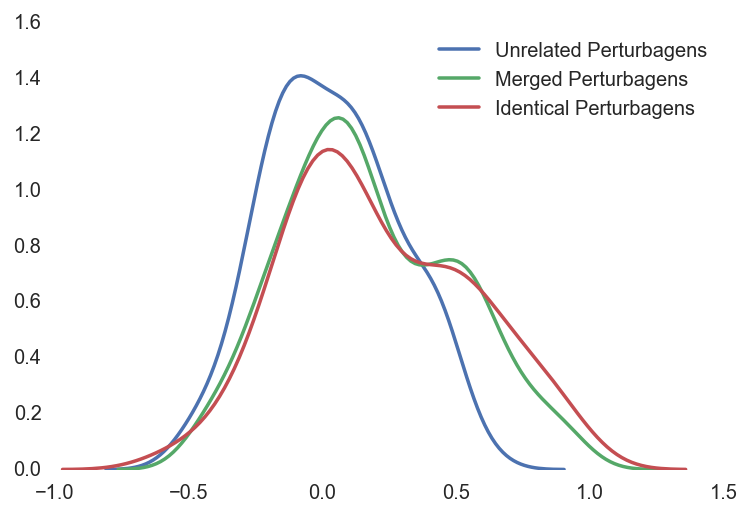

In [126]:
sns.kdeplot(unrel_df['Corr_Value'], label="Unrelated Perturbagens", clip=(-1, 1));
sns.kdeplot(merged_df['Corr_Value'], label="Merged Perturbagens", clip=(-1, 1));
sns.kdeplot(identical_df['Corr_Value'], label="Identical Perturbagens", clip=(-1, 1));

In [74]:
# write this to take columns IDs, create column ids elsewhere
def pert_to_cid(pert_id_here):
    column_ids = ref_dict[pert_id_here]['sig_id_gold']
    return column_ids
        
def cid_to_matrix(cid_here):
    ## extract only the specified columns from the matrix
    GCTObject = gct.GCT(path_to_gctx_file)
    GCTObject.read_gctx_matrix(cid = cid_here, rid = bing_list)
    pert_matrix = GCTObject.matrix
    return pert_matrix

def matrix_to_corr_matrix(matrix_here):
    if type(matrix_here) == list:
        axis=1
    if type(matrix_here) == np.ndarray:
        axis=0
    corr_matrix = scipy.stats.spearmanr(matrix_here, axis = axis)
    corr_matrix_2 = corr_matrix[0]
    #if type(corr_matrix_2) == np.float64:
    #    corr_matrix_2 = np.array([[1,corr_matrix_2],[corr_matrix_2,1]])
    return corr_matrix_2

def corr_matrix_to_sig_corr_value_and_total_corr(corr_matrix):
    output_list = []
    temp_len = len(corr_matrix)
    for i in range(temp_len):
        temp_sum = corr_matrix[:,i].sum() - 1
        temp_mean = temp_sum / (temp_len - 1)
        output_list.append(temp_mean)
    total_corr = np.mean(output_list)  
    output_list /= sum(output_list)
    return output_list, total_corr


def sig_corr_value_to_expr_sig(matrix_here, sig_corr_value):
    temp_len = matrix_here.shape[1]
    matrix_here *= sig_corr_value
    matrix_here = np.sum(matrix_here, axis=1)
    return list(matrix_here)
    

In [49]:
uhhh = np.array([[1,1,2,4,5,6],[3,3,4,1,2,3],[675,654,323,424,512,552],[500,600,300,400,500,500]])
matrix_to_corr_matrix(uhhh)

array([[ 1.        , -0.33882261, -0.40583972, -0.21561439],
       [-0.33882261,  1.        ,  0.03035884, -0.09677419],
       [-0.40583972,  0.03035884,  1.        ,  0.8196886 ],
       [-0.21561439, -0.09677419,  0.8196886 ,  1.        ]])

In [ ]:
# Functions used here are located at the bottom, make sure to run these first
for element in total_dict:
    

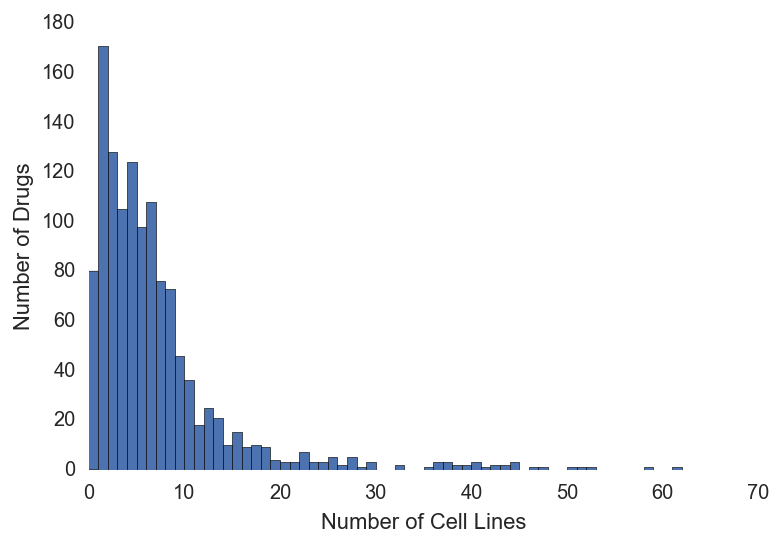

In [124]:
# Distribution of number of distinct cell lines per drugbank drug
cell_count = []
for element in total_dict:
    cell_count.append(len(set(total_dict[element]['gold_cells'])))
plt.hist(cell_count, bins=np.arange(70));
plt.ylabel('Number of Drugs');
plt.xlabel('Number of Cell Lines');

In [178]:
# Total count of number of times each cell line appears in gold_cells
cell_dict = {}
for element in total_dict:
    for key in total_dict[element]['gold_cells']:
        if key in cell_dict:
            cell_dict[key] += 1
        else:
            cell_dict[key] = 1
            
cell_df = pd.DataFrame.from_dict(cell_dict, orient='index',dtype=int)
cell_df = cell_df.sort([0],ascending=False)
cell_df

,0
MCF7,2639
VCAP,1814
A549,1781
PC3,1738
HA1E,1152
HCC515,1060
A375,1031
HT29,839
HEPG2,592
NPC,431


71

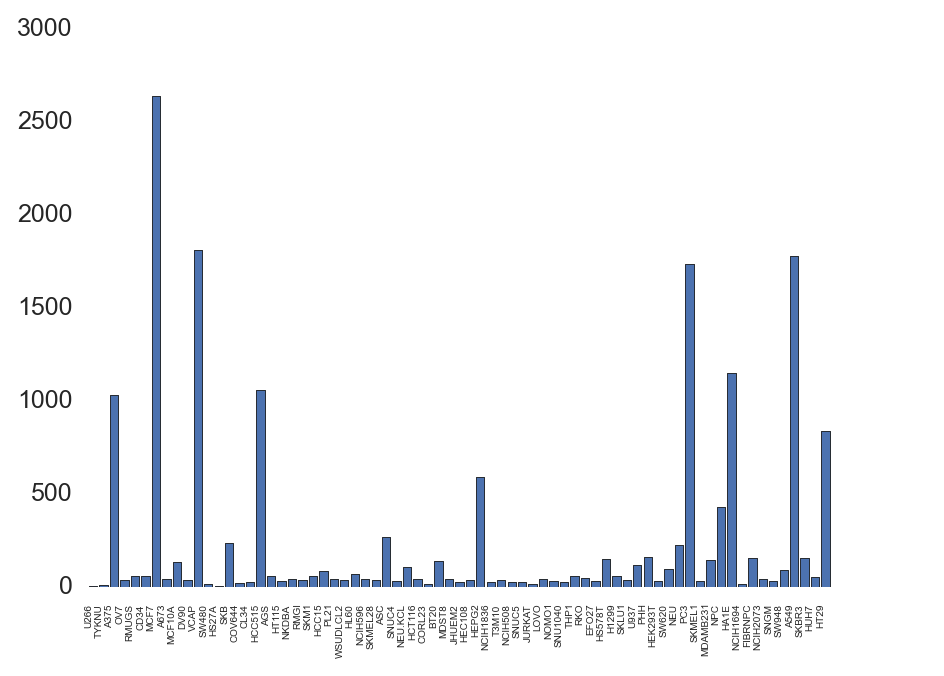

In [33]:
plt.bar(range(len(cell_dict)), cell_dict.values(), align='edge');
plt.xticks(range(len(cell_dict)), cell_dict.keys(), rotation=90, fontsize=4);
len(cell_dict)

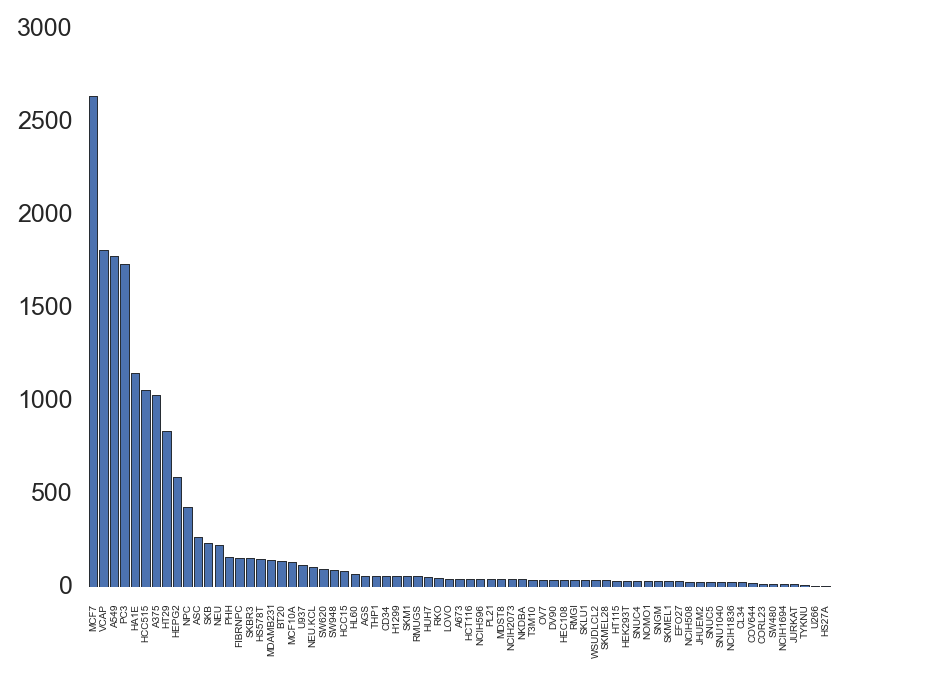

In [203]:
plt.bar(range(len(cell_df)), cell_df[0]);
plt.xticks(np.arange(len(cell_df)) + 0.5, list(cell_df.index), rotation=90, fontsize=4);

In [194]:
cell_df.index

Index([u'MCF7', u'VCAP', u'A549', u'PC3', u'HA1E', u'HCC515', u'A375', u'HT29', u'HEPG2', u'NPC', u'ASC', u'SKB', u'NEU', u'PHH', u'FIBRNPC', u'SKBR3', u'HS578T', u'MDAMB231', u'BT20', u'MCF10A', u'U937', u'NEU.KCL', u'SW620', u'SW948', u'HCC15', u'HL60', u'AGS', u'THP1', u'CD34', u'H1299', u'SKM1', u'RMUGS', u'HUH7', u'RKO', u'LOVO', u'A673', u'HCT116', u'NCIH596', u'PL21', u'MDST8', u'NCIH2073', u'NKDBA', u'T3M10', u'OV7', u'DV90', u'HEC108', u'RMGI', u'SKLU1', u'WSUDLCL2', u'SKMEL28', u'HT115', u'HEK293T', u'SNUC4', u'NOMO1', u'SNGM', u'SKMEL1', u'EFO27', u'NCIH508', u'JHUEM2', u'SNUC5', u'SNU1040', u'NCIH1836', u'CL34', u'COV644', u'CORL23', u'SW480', u'NCIH1694', u'JURKAT', u'TYKNU', u'U266', u'HS27A'], dtype='object')

In [211]:
# Cell line to cell line correlation
# corr_matrix & gold_cells
cell_corr = {}
for element in total_dict:
    if len(total_dict[element]['gold_cells']) <= 1:
        continue
    if len(total_dict[element]['gold_cells']) == 2:
        temp_value = total_dict[element]['corr_matrix'].copy()
        temp_row_cell = total_dict[element]['gold_cells'][0]
        temp_col_cell = total_dict[element]['gold_cells'][1]
        temp_row_dict = cell_corr.setdefault(temp_row_cell, {temp_col_cell : []})
        try:
            temp_row_dict[temp_col_cell].append(temp_value)
        except:
            temp_row_dict[temp_col_cell] = [temp_value]
        temp_col_dict = cell_corr.setdefault(temp_col_cell, {temp_row_cell : []})
        try:
            temp_col_dict[temp_row_cell].append(temp_value)
        except:
            temp_col_dict[temp_row_cell] = [temp_value]
        continue
    for i in range(len(total_dict[element]['corr_matrix'])):
        temp_row_cell = total_dict[element]['gold_cells'][i]
        for j in range(len(total_dict[element]['corr_matrix'])):
            if i == j:
                continue
            temp_col_cell = total_dict[element]['gold_cells'][j]
            temp_value = total_dict[element]['corr_matrix'][i][j]
            temp_dict = cell_corr.setdefault(temp_row_cell, {temp_col_cell : []})
            try:
                temp_dict[temp_col_cell].append(temp_value)
            except:
                temp_dict[temp_col_cell] = [temp_value]

In [212]:
# make cell_corr the mean of the lists originally in cell_corr
for element in cell_corr:
    for key in cell_corr[element]:
        cell_corr[element][key] = float(np.mean(cell_corr[element][key]))

In [213]:
# create empty data frame then iterate through it, filling in values from cell_corr
index_list = cell_corr.keys()
cell_dat = pd.DataFrame(np.nan, index = index_list, columns = index_list)

#note that for pandas dataframe it is [column][row]
for element in cell_corr:
    for key in cell_corr[element]:
        cell_dat[key][element] = cell_corr[element][key]

mask = cell_dat.isnull()

# do this all again, but exclude NAs, changing them instead to -1.00 so we can use clustermap. Now we have mask.

index_list = cell_corr.keys()
cell_dat = pd.DataFrame(-1.00, index = index_list, columns = index_list)

#note that for pandas dataframe it is [column][row]
for element in cell_corr:
    for key in cell_corr[element]:
        cell_dat[key][element] = cell_corr[element][key]

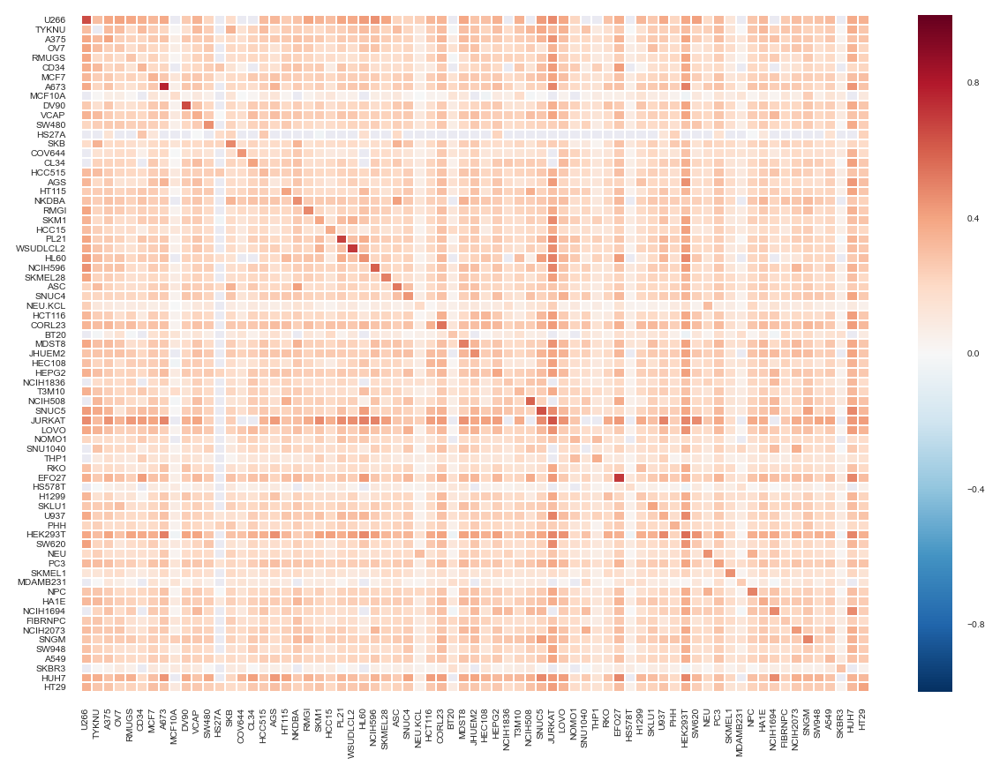

In [214]:
sns.set(font_scale=0.42)
ax = sns.heatmap(cell_dat, mask = mask);
#fig.savefig('cell_heatmap.png')
#fig, ax = plt.subplots()

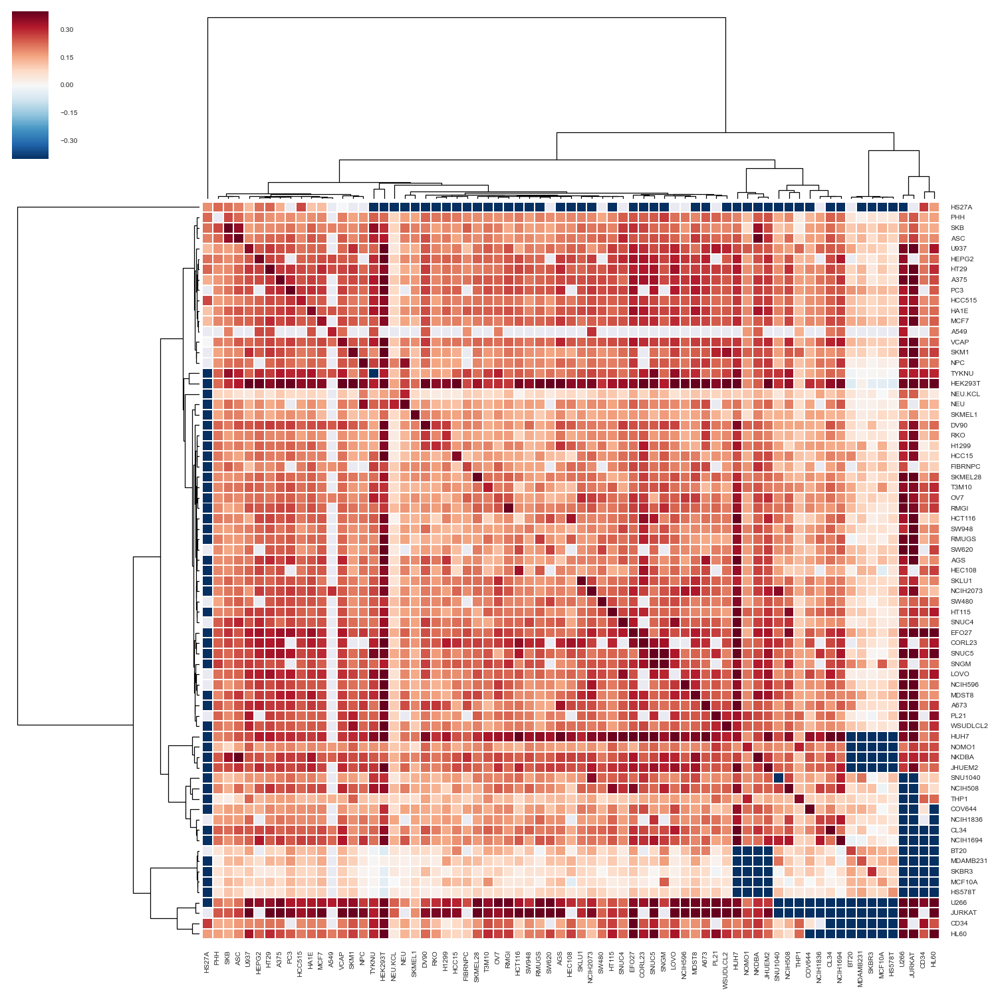

In [228]:
#fig, clusterfig = plt.subplots()
#colors = ["windows blue", "amber", "white", "faded green", "dusty purple"]
#apple = sns.palplot(sns.xkcd_palette(colors))
clusterfig = sns.clustermap(cell_dat, mask = mask, vmin=-0.2, vmax=0.4)
#clusterfig.savefig('cell_clustermap.png')


In [204]:
# Run this to restrict cell_dict to only cell lines with over 200 gold signatures (must create cell_dict above)
to_del_list = []
for element in cell_dict:
    if cell_dict[element] < 200:
        to_del_list.append(element)
for element in to_del_list:
    del cell_dict[element]

In [ ]:
# Run this to fill cell_dat2 dataframe from restricted cell_dict
index_list = cell_dict.keys()
cell_dat2 = pd.DataFrame(np.nan, index = index_list, columns = index_list)
for element in cell_corr:
    if element in index_list:
        for key in cell_corr[element]:
            if key in index_list:
                cell_dat2[key][element] = cell_corr[element][key]

In [5]:
cell_dat2

NameError: name 'cell_dat2' is not defined

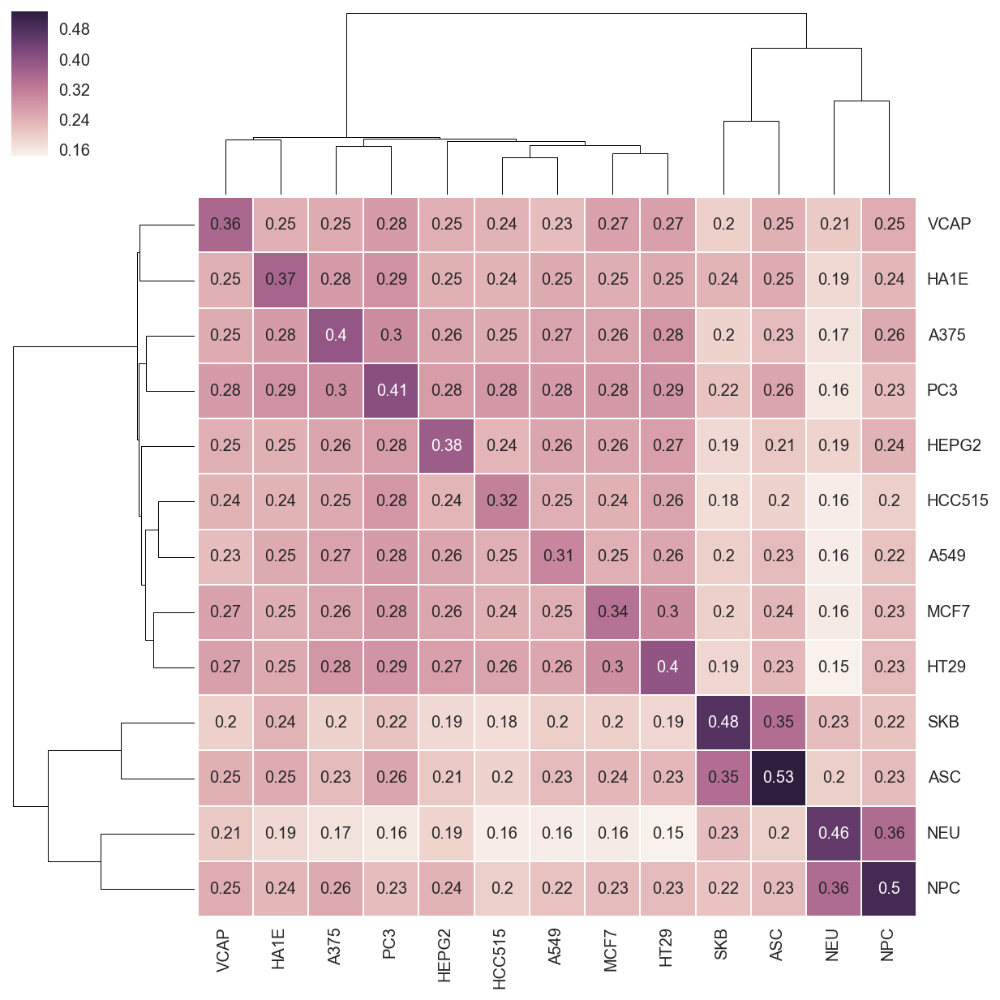

In [23]:
clusterfig = sns.clustermap(cell_dat2, annot=True);

In [ ]:
A375: cancer cell line (cc)
MCF7: cc
VCAP: cc
HCC515: cc
ASC: primary adipocyte
HEPG2: cc
PC3: cc
NPC: primary iPS-derived neural progenitor
HA1E: immortalized normal kidney epithelial
A549: cc
HT29: cc
NEU: primary terminally differentiated neuron

In [2]:
total_dict.keys()

NameError: name 'total_dict' is not defined

In [5]:
pert_list = []
for key in total_dict:
    if len(total_dict[key]['pert_id']) >= 2:
        if total_dict[key]['total_corr'] != 'NA':
            pert_list.append([len(total_dict[key]['sig_id_gold']), total_dict[key]['total_corr'], 'multi'])
    if len(total_dict[key]['pert_id']) == 1:
        if total_dict[key]['total_corr'] != 'NA':
            pert_list.append([len(total_dict[key]['sig_id_gold']), total_dict[key]['total_corr'], 'single'])
pert_df = pd.DataFrame(pert_list, columns = ['gold sig count', 'total correlation', 'classification'])

In [24]:
print(index_list)

['A375', 'MCF7', 'VCAP', 'SKB', 'HCC515', 'ASC', 'HEPG2', 'NEU', 'PC3', 'NPC', 'HA1E', 'A549', 'HT29']


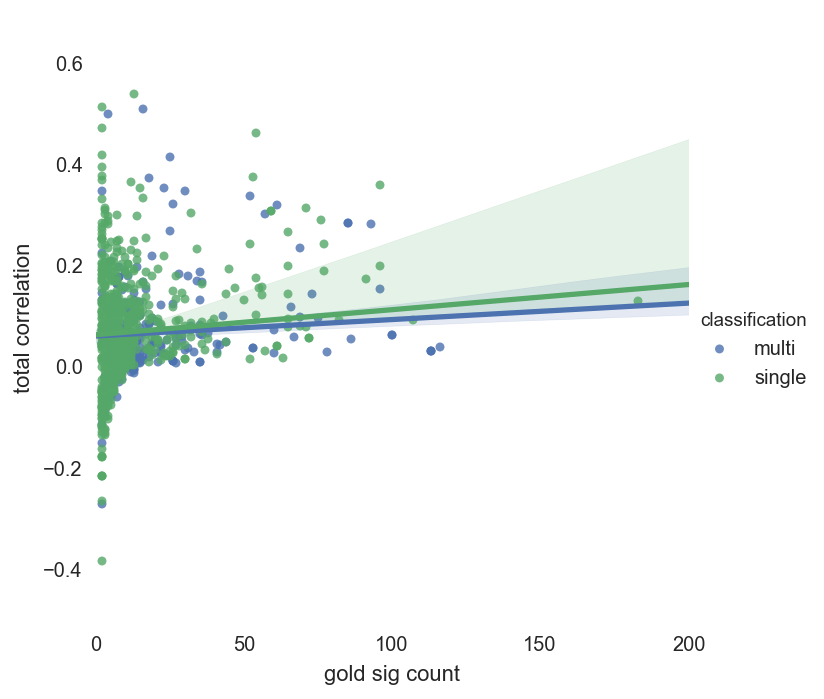

In [12]:
pert_plot = sns.lmplot('gold sig count', 'total correlation', pert_df, hue='classification');
pert_plot.set(xlim = (0,200));
pert_plot.set(ylim=(-0.5, 0.7));

In [276]:
# Compare number of significant genes vs number of signatures contributing to consensus signature
gene_count_v_sig_count_list = []
for key in total_dict:
    print(key)
    if type(total_dict[key]['cons_expr_sig'][0]) == list:
        total_dict[key]['cons_expr_sig'] = list(itertools.chain.from_iterable(total_dict[key]['cons_expr_sig']))
    if len(total_dict[key]['cons_expr_sig']) > 10:
        temp_array = [x for x in total_dict[key]['cons_expr_sig'] if x >= 2 or x <=-2]
        gene_count = math.log10(len(temp_array) + 1)
        sig_count = math.log10(len(total_dict[key]['sig_id_gold']))
        gene_count_v_sig_count_list.append([sig_count, gene_count])
gcount_v_scount = pd.DataFrame(gene_count_v_sig_count_list, columns = ['number of gold signatures(log10)','significant genes(log10)'])

DB04179
DB01418
DB00150
DB00742
DB04574
DB01413
DB01412
DB04175
DB04177
DB00904
DB00774
DB00443
DB00957
DB04573
DB00442
DB05318
DB00862
DB06999
DB00162
DB00967
DB01099
DB01098
DB01407
DB01095
DB01097
DB00679
DB01091
DB01090
DB01092
DB00892
DB01259
DB07373
DB06704
DB01254
DB01253
DB01700
DB01251
DB01077
DB05511
DB01075
DB01074
DB08835
DB01178
DB01179
DB01176
DB01177
DB01175
DB01172
DB01173
DB01171
DB08603
DB08607
DB03777
DB08604
DB08162
DB00671
DB01950
DB08167
DB00471
DB00472
DB00473
DB00476
DB00477
DB00478
DB00479
DB03671
DB01002
DB01003
DB01000
DB01001
DB01006
DB01007
DB01004
DB04077
DB00571
DB00570
DB01008
DB00572
DB00575
DB00574
DB00577
DB00576
DB00750
DB00752
DB00979
DB00754
DB00757
DB00208
DB00207
DB00206
DB00977
DB00204
DB00203
DB00970
DB00973
DB00972
DB07841
DB01614
DB08881
DB04608
DB04604
DB04216
DB00683
DB00682
DB00681
DB00680
DB00499
DB00748
DB02659
DB02656
DB00688
DB00373
DB00372
DB00278
DB00279
DB00377
DB00376
DB00375
DB00215
DB00272
DB00273
DB00379
DB00378
DB07557
DB00274


In [278]:
gcount_v_scount

,number of gold signatures(log10),significant genes(log10)
0,0.000000,1.361728
1,0.301030,1.477121
2,0.000000,1.690196
3,0.845098,0.000000
4,0.000000,2.127105
5,0.301030,1.653213
6,1.000000,1.322219
7,1.255273,2.953276
8,0.698970,3.202488
9,0.778151,1.255273


In [273]:
gcount_v_scount

,number of gold signatures(log10),significant genes(log10)
0,0.000000,4.026901
1,0.301030,1.477121
2,0.000000,4.026901
3,0.845098,0.000000
4,0.000000,4.026901
5,0.301030,1.653213
6,1.000000,1.322219
7,1.255273,2.953276
8,0.698970,3.202488
9,0.778151,1.255273


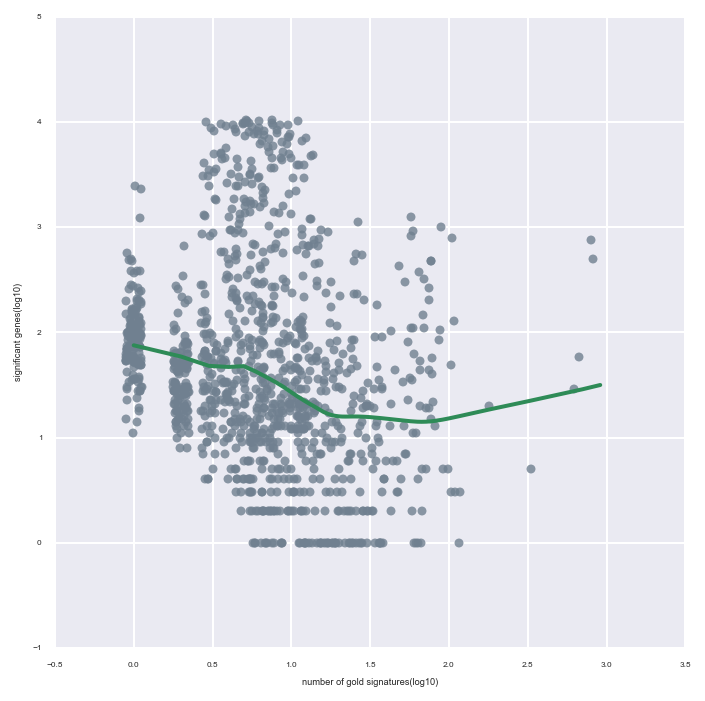

In [98]:
xplot = sns.lmplot('number of gold signatures(log10)', 'significant genes(log10)', gcount_v_scount, lowess = True, x_jitter = .05, 
        scatter_kws={"marker": ".", "color": "slategray"},
        line_kws={"linewidth": 2, "color": "seagreen"});
#xplot.set(ylim=(0, 5));

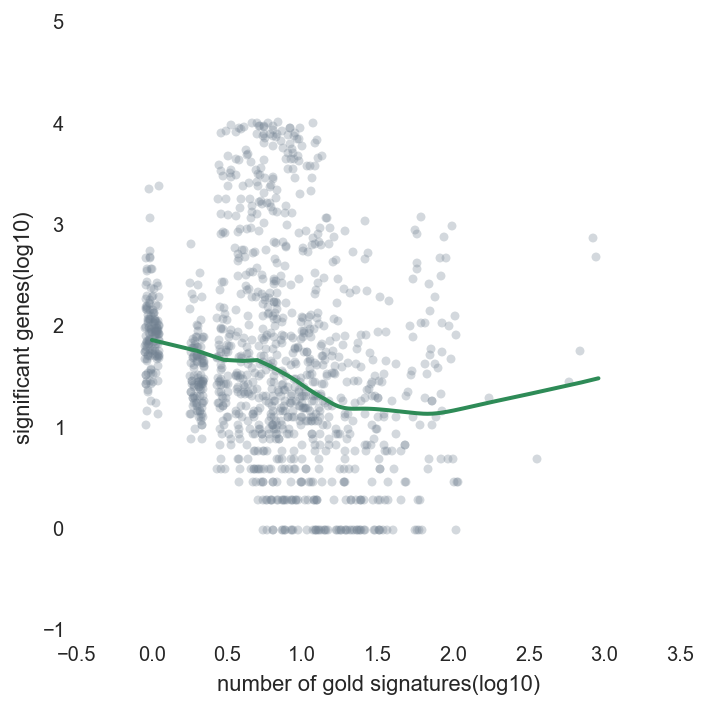

In [281]:
xplot2 = sns.lmplot('number of gold signatures(log10)', 'significant genes(log10)', gcount_v_scount, lowess = True, x_jitter = .05, 
        scatter_kws={"marker": ".", "color": "slategray", "alpha":0.3},
        line_kws={"linewidth": 2, "color": "seagreen"});
#xplot.set(ylim=(0, 5));

0.9411031007766724

In [ ]:
# write this to take columns IDs, create column ids elsewhere
def pert_to_cid(pert_id_here):
    column_ids = ref_dict[pert_id_here]['sig_id_gold']
    return column_ids
        
def cid_to_matrix(cid_here):
    ## extract only the specified columns from the matrix
    GCTObject = gct.GCT(path_to_gctx_file)
    GCTObject.read_gctx_matrix(cid = cid_here, rid = bing_list)
    pert_matrix = GCTObject.matrix
    return pert_matrix

def matrix_to_corr_matrix(matrix_here):
    corr_matrix = scipy.stats.spearmanr(matrix_here)
    corr_matrix_2 = corr_matrix[0]
    return corr_matrix_2

def corr_matrix_to_sig_corr_value_and_total_corr(corr_matrix):
    output_list = []
    temp_len = len(corr_matrix)
    for i in range(temp_len):
        temp_sum = corr_matrix[:,i].sum() - 1
        temp_mean = temp_sum / (temp_len - 1)
        output_list.append(temp_mean)
    total_corr = np.mean(output_list)  
    output_list /= sum(output_list)
    return output_list, total_corr

def sig_corr_value_to_expr_sig(matrix_here, sig_corr_value):
    temp_len = matrix_here.shape[1]
    matrix_here *= sig_corr_value
    matrix_here = np.sum(matrix_here, axis=1)
    return list(matrix_here)
    

In [53]:
#os.chdir("/Users/leobrueggeman/GitHub/LINCS/l1ktools/python")
path_to_gctx_file = '/Volumes/HimmelWD/lincs/modzs.gctx'


In [4]:
# Clustering Diuretics and Anti-Inflammatory agents
anti_inflam_list = ['DB00052', 'DB00223', 'DB00253', 'DB00324', 'DB00443',
                    'DB00591', 'DB00620', 'DB00635', 'DB00687', 'DB00716' 'DB00741',
                    'DB00769', 'DB00846', 'DB00860', 'DB00959', 'DB01013', 'DB01025',
                    'DB01047', 'DB01130', 'DB01234', 'DB06168', 'DB06766', 'DB06781', 'DB06802']
diur_complete_list = ['DB00214', 'DB00310', 'DB00311', 'DB00384', 'DB00421', 'DB00436', 'DB00524', 'DB00594', 'DB00606',
            'DB00695', 'DB00774', 'DB00808', 'DB00819', 'DB00880', 'DB00887', 'DB00903', 'DB00999',
             'DB01021', 'DB04831']

In [16]:
drugbank_ref_df = pd.read_table('http://git.dhimmel.com/drugbank/data/drugbank.tsv')
drugbank_ref_df = drugbank_ref_df.set_index(drugbank_ref_df['drugbank_id'])

In [17]:
drugbank_ref_df

,drugbank_id,name,type,groups,atc_codes,inchikey,inchi
drugbank_id,,,,,,,
DB00001,DB00001,Lepirudin,biotech,approved,B01AE02,NaN,NaN
DB00002,DB00002,Cetuximab,biotech,approved,L01XC06,NaN,NaN
DB00003,DB00003,Dornase alfa,biotech,approved,R05CB13,NaN,NaN
DB00004,DB00004,Denileukin diftitox,biotech,approved|investigational,L01XX29,NaN,NaN
DB00005,DB00005,Etanercept,biotech,approved|investigational,L04AB01,NaN,NaN
DB00006,DB00006,Bivalirudin,biotech,approved|investigational,B01AE06,NaN,NaN
DB00007,DB00007,Leuprolide,biotech,approved|investigational,L02AE02,NaN,NaN
DB00008,DB00008,Peginterferon alfa-2a,biotech,approved|investigational,L03AB11,NaN,NaN
DB00009,DB00009,Alteplase,biotech,approved,B01AD02|S01XA13,NaN,NaN


In [110]:
anti_inflam = [val for val in anti_inflam_list if val in total_dict.keys()]
diur_list = [val for val in diur_complete_list if val in total_dict.keys()]
total_drug_list = anti_inflam + diur_list
total_drug_dict = {}

for element in total_drug_list:
    if element in anti_inflam:
        total_drug_dict['AA: ' + drugbank_ref_df.loc[element]['name']] = element
    if element in diur_list:
        total_drug_dict['DR: ' + drugbank_ref_df.loc[element]['name']] = element

In [111]:
total_drug_dict

{'AA: Amlexanox': 'DB01025',
 'AA: Betamethasone': 'DB00443',
 'AA: Clobetasol propionate': 'DB01013',
 'AA: Dexamethasone': 'DB01234',
 'AA: Diflorasone': 'DB00223',
 'AA: Fluocinolone Acetonide': 'DB00591',
 'AA: Fluocinonide': 'DB01047',
 'AA: Fluorometholone': 'DB00324',
 'AA: Flurandrenolide': 'DB00846',
 'AA: Medrysone': 'DB00253',
 'AA: Methylprednisolone': 'DB00959',
 'AA: Prednicarbate': 'DB01130',
 'AA: Prednisolone': 'DB00860',
 'AA: Prednisone': 'DB00635',
 'AA: Triamcinolone': 'DB00620',
 'DR: Acetazolamide': 'DB00819',
 'DR: Amiloride': 'DB00594',
 'DR: Bendroflumethiazide': 'DB00436',
 'DR: Bumetanide': 'DB00887',
 'DR: Chlorothiazide': 'DB00880',
 'DR: Chlorthalidone': 'DB00310',
 'DR: Ethacrynic acid': 'DB00903',
 'DR: Furosemide': 'DB00695',
 'DR: Hydrochlorothiazide': 'DB00999',
 'DR: Hydroflumethiazide': 'DB00774',
 'DR: Indapamide': 'DB00808',
 'DR: Metolazone': 'DB00524',
 'DR: Spironolactone': 'DB00421',
 'DR: Ticrynafen': 'DB04831',
 'DR: Torasemide': 'DB00214',

In [92]:
'w' + drugbank_ref_df.loc['DB00001']['name']

'wLepirudin'

In [112]:
applied_drug_df = pd.DataFrame(np.nan, index=total_drug_dict.keys(), columns=range(10638))

In [113]:
for element in total_drug_dict:
    temp_drug = total_drug_dict[element]
    fixer = []
    print(element)
    if total_dict[temp_drug]['cons_expr_sig'] == 'NA':
        continue
    if type(total_dict[temp_drug]['cons_expr_sig'][0]) == list:
        fixer = list(itertools.chain.from_iterable(total_dict[temp_drug]['cons_expr_sig']))
    for i in range(10638):
        if len(fixer) != 0:
            temp_value = fixer[i]
        else:
            temp_value = total_dict[temp_drug]['cons_expr_sig'][i]
        applied_drug_df[i][element] = temp_value

DR: Trichlormethiazide
AA: Fluocinolone Acetonide
DR: Chlorthalidone
DR: Hydroflumethiazide
DR: Chlorothiazide
DR: Acetazolamide
AA: Prednicarbate
AA: Betamethasone
DR: Bumetanide
AA: Medrysone
DR: Furosemide
AA: Amlexanox
AA: Prednisolone
DR: Torasemide
AA: Fluorometholone
DR: Ethacrynic acid
AA: Diflorasone
DR: Ticrynafen
AA: Flurandrenolide
DR: Metolazone
DR: Amiloride
DR: Spironolactone
AA: Methylprednisolone
AA: Clobetasol propionate
DR: Hydrochlorothiazide
DR: Bendroflumethiazide
DR: Triamterene
AA: Prednisone
AA: Triamcinolone
DR: Indapamide
AA: Dexamethasone
AA: Fluocinonide


In [6]:
path_to_bing_file = '/Users/leobrueggeman/GitHub/LINCS/isbing_pr_genelist.json'
json_bing = json.loads(open(path_to_bing_file).read())
bing_list = list(json_bing)

In [53]:
print(bing_list)

[u'218075_at', u'218434_s_at', u'202852_s_at', u'205434_s_at', u'201511_at', u'201000_at', u'222064_s_at', u'202169_s_at', u'202170_s_at', u'210852_s_at', u'214829_at', u'209165_at', u'205986_at', u'209460_at', u'209459_s_at', u'203505_at', u'212772_s_at', u'204343_at', u'213353_at', u'219577_s_at', u'204719_at', u'209993_at', u'203192_at', u'209620_s_at', u'206317_s_at', u'214209_s_at', u'202804_at', u'202805_s_at', u'213485_s_at', u'206155_at', u'208161_s_at', u'209641_s_at', u'203196_at', u'209380_s_at', u'214033_at', u'202850_at', u'203981_s_at', u'201872_s_at', u'201873_s_at', u'200045_at', u'207622_s_at', u'209246_at', u'209247_s_at', u'202394_s_at', u'204567_s_at', u'211113_s_at', u'209735_at', u'218633_x_at', u'221927_s_at', u'210006_at', u'205566_at', u'221815_at', u'63825_at', u'87100_at', u'213017_at', u'218581_at', u'213805_at', u'213935_at', u'218739_at', u'221552_at', u'45288_at', u'209027_s_at', u'209028_s_at', u'207268_x_at', u'209856_x_at', u'211793_s_at', u'202123_s_a

In [5]:
lm_list = []
with open('/Users/leobrueggeman/GitHub/LINCS/islm_probe_list.csv', 'r') as f:
    reader = csv.reader(f, delimiter='\n')
    for row in reader:
        lm_list.extend(row)

In [60]:
len(lm_list)

1171

In [58]:
to_del_list = []
for i in range(len(bing_list)):
    if bing_list[i] in lm_list:
        continue
    to_del_list.append(i)

In [7]:
to_keep_list = []
for i in range(len(bing_list)):
    if bing_list[i] in lm_list:
        to_keep_list.append(i)

In [233]:
to_keep_list

[5,
 13,
 22,
 33,
 39,
 43,
 55,
 59,
 66,
 74,
 89,
 90,
 93,
 97,
 107,
 119,
 156,
 171,
 174,
 179,
 186,
 188,
 197,
 202,
 209,
 223,
 268,
 280,
 282,
 294,
 298,
 302,
 323,
 327,
 329,
 342,
 371,
 383,
 407,
 440,
 464,
 476,
 478,
 517,
 521,
 538,
 540,
 544,
 551,
 552,
 567,
 586,
 601,
 607,
 611,
 619,
 625,
 626,
 649,
 654,
 656,
 666,
 675,
 680,
 686,
 696,
 725,
 735,
 750,
 776,
 779,
 786,
 798,
 814,
 815,
 820,
 828,
 837,
 841,
 844,
 863,
 869,
 879,
 889,
 893,
 900,
 907,
 916,
 918,
 921,
 923,
 925,
 935,
 943,
 945,
 952,
 958,
 979,
 990,
 996,
 998,
 1009,
 1018,
 1168,
 1169,
 1188,
 1238,
 1244,
 1245,
 1273,
 1281,
 1294,
 1299,
 1309,
 1334,
 1335,
 1338,
 1339,
 1341,
 1345,
 1349,
 1353,
 1361,
 1363,
 1364,
 1394,
 1396,
 1398,
 1401,
 1408,
 1411,
 1412,
 1414,
 1416,
 1418,
 1420,
 1422,
 1424,
 1430,
 1439,
 1471,
 1475,
 1476,
 1490,
 1504,
 1513,
 1515,
 1517,
 1527,
 1540,
 1548,
 1556,
 1559,
 1572,
 1574,
 1578,
 1580,
 1584,
 1585,
 15

In [114]:
applied_drug_df

,0,1,2,3,4,5,6,7,8,9,...,10628,10629,10630,10631,10632,10633,10634,10635,10636,10637
DR: Trichlormethiazide,1.135201,-0.473421,-0.355607,-0.516818,-0.122813,0.381417,-1.147566,-0.637646,-1.156650,1.979890,...,-1.165639,0.451100,0.087922,-0.332773,-0.691945,-0.609432,-0.519864,-0.718909,-0.406384,0.348854
AA: Fluocinolone Acetonide,0.488307,-0.367260,-0.120023,-0.286362,0.242470,0.819715,-0.098326,-0.259621,-0.447903,-0.216712,...,-0.776462,-0.275265,-0.399107,-0.280276,-0.757095,-0.214639,-0.012789,-0.051704,0.379533,-0.147997
DR: Chlorthalidone,0.039850,0.605171,0.641476,0.789655,-0.155798,-0.029601,0.532013,0.440723,-0.311783,-0.018285,...,0.006625,-0.816860,-0.549132,1.227020,1.436401,-0.246925,0.231337,-0.024742,0.526884,-0.300898
DR: Hydroflumethiazide,0.473403,0.013132,-0.451293,0.028042,0.108301,-0.456251,-0.271085,-0.589091,-0.681864,-0.275399,...,-0.209393,0.725625,0.538009,0.013319,-0.801482,0.094707,0.052492,-0.092173,0.220099,0.365928
DR: Chlorothiazide,0.035961,0.621694,0.387036,-0.186026,0.556466,0.660938,-0.657312,0.612237,0.481568,-0.070198,...,0.292694,-0.032275,0.343325,-0.126268,0.520615,0.283288,0.274426,0.180663,0.054353,0.175094
DR: Acetazolamide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AA: Prednicarbate,-0.164531,-0.750363,-0.772536,-0.249908,0.034996,-0.562414,-0.363660,-0.047576,-0.568641,-0.670860,...,-0.100768,0.313241,-0.020206,-0.217732,-1.074926,-0.325166,-0.202518,-0.497908,-0.316937,0.488459
AA: Betamethasone,-0.064248,0.020961,-0.009156,-0.213475,-0.216209,-0.180057,0.263162,0.317528,0.253539,0.186620,...,-0.049298,-0.390194,-0.222411,-0.072203,0.079833,-0.085967,0.036395,-0.144233,-0.118429,-0.112381
DR: Bumetanide,3.852573,-4.530150,2.880561,-3.078929,2.923491,-0.752112,4.452127,-5.208054,-13.771621,-0.365559,...,1.706058,3.053862,-2.548151,10.417090,-7.998402,12.516043,-6.542692,-3.356009,-3.585256,9.668303
AA: Medrysone,-0.522627,0.247439,0.564307,-0.364976,0.048436,-0.258376,-0.366206,-0.028232,-0.021478,0.180385,...,-0.334045,-0.375891,-0.236583,-0.081319,-0.517152,-0.510192,-0.050513,-0.287640,0.354337,-0.206710


In [115]:
final_drug_df = applied_drug_df.drop(['DR: Acetazolamide', 'DR: Furosemide', 'DR: Indapamide', 'DR: Bumetanide'])
final_drug_df.drop(final_drug_df.columns[to_del_list], axis=1, inplace=True)

In [116]:
final_drug_df

,5,13,22,33,39,43,55,59,66,74,...,10562,10570,10580,10590,10602,10604,10608,10613,10615,10631
DR: Trichlormethiazide,0.381417,0.321924,-0.619440,0.552356,1.410540,-1.797796,-1.171552,1.478502,0.679125,-0.664976,...,0.922442,1.278034,-0.178410,1.004252,1.656316,0.261068,1.504647,-0.809513,-0.392323,-0.332773
AA: Fluocinolone Acetonide,0.819715,-0.002658,0.168330,0.505399,-0.106505,-0.490275,0.145047,0.212199,1.344736,0.139428,...,0.870321,1.112415,1.049274,-0.017672,-0.353407,0.070246,0.807350,0.206500,-0.017860,-0.280276
DR: Chlorthalidone,-0.029601,0.197553,0.362064,-0.528746,0.418812,0.403641,1.048304,-1.125062,0.424171,1.154109,...,0.472959,-0.188079,-1.489047,1.325329,0.268036,-2.499500,-0.314794,0.343347,-1.546568,1.227020
DR: Hydroflumethiazide,-0.456251,0.335220,-1.014426,0.613065,1.208860,-0.693873,0.780059,1.830816,-0.396244,0.043507,...,1.165931,1.022434,0.479590,-0.278718,0.389516,0.185165,-0.108021,-0.111169,0.612267,0.013319
DR: Chlorothiazide,0.660938,-0.404135,0.700607,-0.686476,-0.117214,0.545184,-0.359616,-0.383943,-0.546513,-0.059858,...,-0.811760,0.089966,-0.321983,-0.150284,0.990240,-0.516761,0.326568,0.838567,-0.650387,-0.126268
AA: Prednicarbate,-0.562414,0.038479,-0.494016,1.386164,1.042101,-0.461038,0.649842,0.202353,-0.072342,0.161226,...,1.570330,1.335705,0.369571,0.354657,0.589706,0.452826,-0.297868,-0.180377,0.376493,-0.217732
AA: Betamethasone,-0.180057,-0.062126,-0.073155,0.248439,-0.280419,0.624767,-0.111239,-0.430068,-0.046029,0.553042,...,-0.062922,-0.099640,-0.447423,0.291529,-0.384941,-0.068414,0.167339,0.220575,-0.116408,-0.072203
AA: Medrysone,-0.258376,0.370252,0.108415,-0.554552,0.129119,0.331827,0.502327,0.087383,0.150126,0.570445,...,0.167320,-0.356505,0.015951,-0.142511,-0.860987,0.251775,0.187365,-0.180640,-0.249343,-0.081319
AA: Amlexanox,-0.296831,-0.710424,0.026136,0.244264,-0.633793,0.552111,-0.462832,-0.671154,0.764991,0.401710,...,-0.263509,-0.314496,-0.984593,-0.070636,-0.005540,-0.170193,0.223717,0.543000,-0.419466,0.827703
AA: Prednisolone,0.231890,-0.037451,-0.435063,-0.080503,0.063427,-0.694824,-0.144643,0.065822,0.370053,0.560075,...,0.140417,0.147498,1.322272,0.383898,0.262611,1.131135,0.463110,-0.370956,0.061455,-0.213912


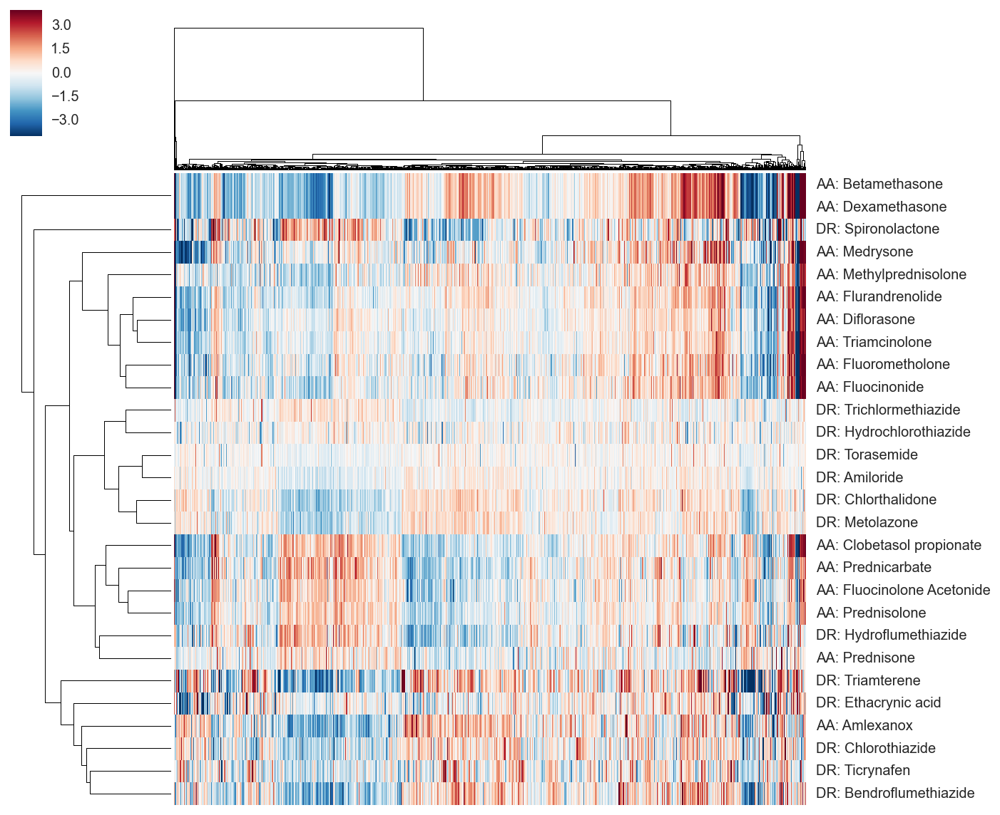

In [121]:
clusterfig2 = sns.clustermap(final_drug_df, linewidths=0, z_score=0, vmax=4, vmin=-4, xticklabels=False);

In [14]:
final_drug_df

,0,1,2,3,4,5,6,7,8,9,...,10628,10629,10630,10631,10632,10633,10634,10635,10636,10637
DB00223,-0.143266,0.182930,0.195295,-0.608871,0.036987,-0.351121,0.551810,0.338604,0.222664,0.106283,...,0.082631,-0.145339,-0.053939,0.069224,-0.288851,-0.789625,-0.209005,-0.346969,0.025459,-0.115671
DB00253,-0.522627,0.247439,0.564307,-0.364976,0.048436,-0.258376,-0.366206,-0.028232,-0.021478,0.180385,...,-0.334045,-0.375891,-0.236583,-0.081319,-0.517152,-0.510192,-0.050513,-0.287640,0.354337,-0.206710
DB00324,-0.117373,0.070030,-0.860144,-0.042430,-0.086503,-0.018361,0.083100,-0.320781,-0.319370,0.126271,...,-0.579314,-0.832924,-0.813614,-0.102231,-0.571863,-0.342670,-0.102189,-0.240369,-0.096035,-0.623697
DB00443,-0.064248,0.020961,-0.009156,-0.213475,-0.216209,-0.180057,0.263162,0.317528,0.253539,0.186620,...,-0.049298,-0.390194,-0.222411,-0.072203,0.079833,-0.085967,0.036395,-0.144233,-0.118429,-0.112381
DB00591,0.488307,-0.367260,-0.120023,-0.286362,0.242470,0.819715,-0.098326,-0.259621,-0.447903,-0.216712,...,-0.776462,-0.275265,-0.399107,-0.280276,-0.757095,-0.214639,-0.012789,-0.051704,0.379533,-0.147997
DB00620,-0.235755,0.369226,-0.012773,-0.204794,-0.170655,-0.496720,0.321784,0.015927,0.101652,0.107224,...,-0.347100,-0.440173,-0.167859,0.185125,-0.552406,-0.269198,0.099347,-0.297446,0.415524,-0.546219
DB00635,-0.568350,-0.126700,-0.544000,-0.258250,-0.353100,-0.524000,-0.356550,0.376850,0.616300,-0.827050,...,0.125500,-0.133600,0.046800,-0.326750,-0.785300,-0.776750,0.426050,0.683250,0.326950,-0.382400
DB00846,-0.406425,0.034431,0.153290,-0.213828,-0.465134,-0.351362,0.658908,0.320725,0.447109,0.257021,...,-0.120806,-0.113741,0.067299,0.156487,-0.429783,-0.640616,0.210291,-0.153931,0.086509,-0.231101
DB00860,0.090876,-1.023149,-0.567929,-0.138068,0.722347,0.231890,-0.186629,-0.545327,-0.852996,-0.355582,...,-0.394570,-0.004882,-0.234829,-0.213912,-1.174263,-0.278850,-0.146216,-0.161389,0.022138,0.061383
DB00959,0.015869,-0.052436,0.225845,-0.006536,-0.187221,-0.481209,0.058059,0.711511,0.900564,0.700231,...,0.108637,-0.300923,-0.061502,0.370134,0.252727,-0.014075,-0.645413,-0.777654,-0.261230,0.444192


In [8]:
total_drug_df = pd.DataFrame(np.nan, index=total_dict.keys(), columns=to_keep_list)
                             
for element in total_dict:
    temp_drug = element
    fixer = []
    print(element)
    if total_dict[element]['cons_expr_sig'] == 'NA':
        continue
    if type(total_dict[element]['cons_expr_sig'][0]) == list:
        fixer = list(itertools.chain.from_iterable(total_dict[temp_drug]['cons_expr_sig']))
    for i in to_keep_list:
        if len(fixer) != 0:
            temp_value = fixer[i]
        else:
            temp_value = total_dict[element]['cons_expr_sig'][i]
        total_drug_df[i][element] = temp_value

DB04179
DB01418
DB00150
DB00742
DB04574
DB01413
DB01412
DB04175
DB04177
DB00904
DB00774
DB00443
DB00957
DB04573
DB00442
DB05318
DB00862
DB06999
DB00162
DB00967
DB01099
DB01098
DB01407
DB01095
DB01097
DB00679
DB01091
DB01090
DB01092
DB00892
DB01259
DB07373
DB06704
DB01254
DB01253
DB01700
DB01251
DB01077
DB05511
DB01075
DB01074
DB08835
DB01178
DB01179
DB01176
DB01177
DB01175
DB01172
DB01173
DB01171
DB08603
DB08607
DB03777
DB08604
DB08162
DB00671
DB01950
DB08167
DB00471
DB00472
DB00473
DB00476
DB00477
DB00478
DB00479
DB03671
DB01002
DB01003
DB01000
DB01001
DB01006
DB01007
DB01004
DB04077
DB00571
DB00570
DB01008
DB00572
DB00575
DB00574
DB00577
DB00576
DB00750
DB00752
DB00979
DB00754
DB00757
DB00208
DB00207
DB00206
DB00977
DB00204
DB00203
DB00970
DB00973
DB00972
DB07841
DB01614
DB08881
DB04608
DB04604
DB04216
DB00683
DB00682
DB00681
DB00680
DB00499
DB00748
DB02659
DB02656
DB00688
DB00373
DB00372
DB00278
DB00279
DB00377
DB00376
DB00375
DB00215
DB00272
DB00273
DB00379
DB00378
DB07557
DB00274


In [175]:
drugbank_ref_df

,drugbank_id,name,type,groups,atc_codes,inchikey,inchi
drugbank_id,,,,,,,
DB00001,DB00001,Lepirudin,biotech,approved,B01AE02,NaN,NaN
DB00002,DB00002,Cetuximab,biotech,approved,L01XC06,NaN,NaN
DB00003,DB00003,Dornase alfa,biotech,approved,R05CB13,NaN,NaN
DB00004,DB00004,Denileukin diftitox,biotech,approved|investigational,L01XX29,NaN,NaN
DB00005,DB00005,Etanercept,biotech,approved|investigational,L04AB01,NaN,NaN
DB00006,DB00006,Bivalirudin,biotech,approved|investigational,B01AE06,NaN,NaN
DB00007,DB00007,Leuprolide,biotech,approved|investigational,L02AE02,NaN,NaN
DB00008,DB00008,Peginterferon alfa-2a,biotech,approved|investigational,L03AB11,NaN,NaN
DB00009,DB00009,Alteplase,biotech,approved,B01AD02|S01XA13,NaN,NaN


In [67]:
dropper = drugbank_ref_df['atc_codes'].notnull()
drugbank_ref_df = drugbank_ref_df[dropper == True]

In [249]:
# match drugbank drug names to truncated atc codes
non_atc_list = []
drug_name_list = list(total_drug_df.index)
drug_to_atc_dic = {}
for item in drug_name_list:
    if (item in drugbank_ref_df.index) == False:
        non_atc_list.append(item)
        continue
    temp_atc = (drugbank_ref_df['atc_codes'][item])[:1]
    drug_to_atc_dic[item] = temp_atc

In [87]:
# drop non_atc_list from total_drug_df
total_drug_df = total_drug_df.drop(non_atc_list)


In [177]:
drug_to_atc_dic

{'DB00014': 'L02',
 'DB00091': 'L04',
 'DB00121': 'A11',
 'DB00130': 'A16',
 'DB00136': 'A11',
 'DB00140': 'A11',
 'DB00146': 'A11',
 'DB00150': 'N06',
 'DB00159': 'C10',
 'DB00162': 'A11',
 'DB00163': 'A11',
 'DB00170': 'B02',
 'DB00175': 'C10',
 'DB00176': 'N06',
 'DB00177': 'C09',
 'DB00178': 'C09',
 'DB00180': 'R01',
 'DB00186': 'N05',
 'DB00187': 'C07',
 'DB00188': 'L01',
 'DB00191': 'A08',
 'DB00193': 'N02',
 'DB00194': 'J05',
 'DB00195': 'C07',
 'DB00196': 'D01',
 'DB00197': 'A10',
 'DB00199': 'D10',
 'DB00201': 'N06',
 'DB00203': 'G04',
 'DB00204': 'C01',
 'DB00205': 'P01',
 'DB00206': 'C02',
 'DB00207': 'J01',
 'DB00208': 'B01',
 'DB00210': 'D10',
 'DB00211': 'C01',
 'DB00213': 'A02',
 'DB00214': 'C03',
 'DB00215': 'N06',
 'DB00218': 'S01',
 'DB00220': 'J05',
 'DB00222': 'A10',
 'DB00223': 'D07',
 'DB00224': 'J05',
 'DB00227': 'C10',
 'DB00229': 'J01',
 'DB00233': 'J04',
 'DB00234': 'N06',
 'DB00235': 'C01',
 'DB00238': 'J05',
 'DB00239': 'D01',
 'DB00242': 'L01',
 'DB00243': 

In [104]:
#total_drug_df

In [105]:
# do i need this?
plot_index = []
for element in total_drug_df.index:
    plot_index.append(drug_to_atc_dic[element])

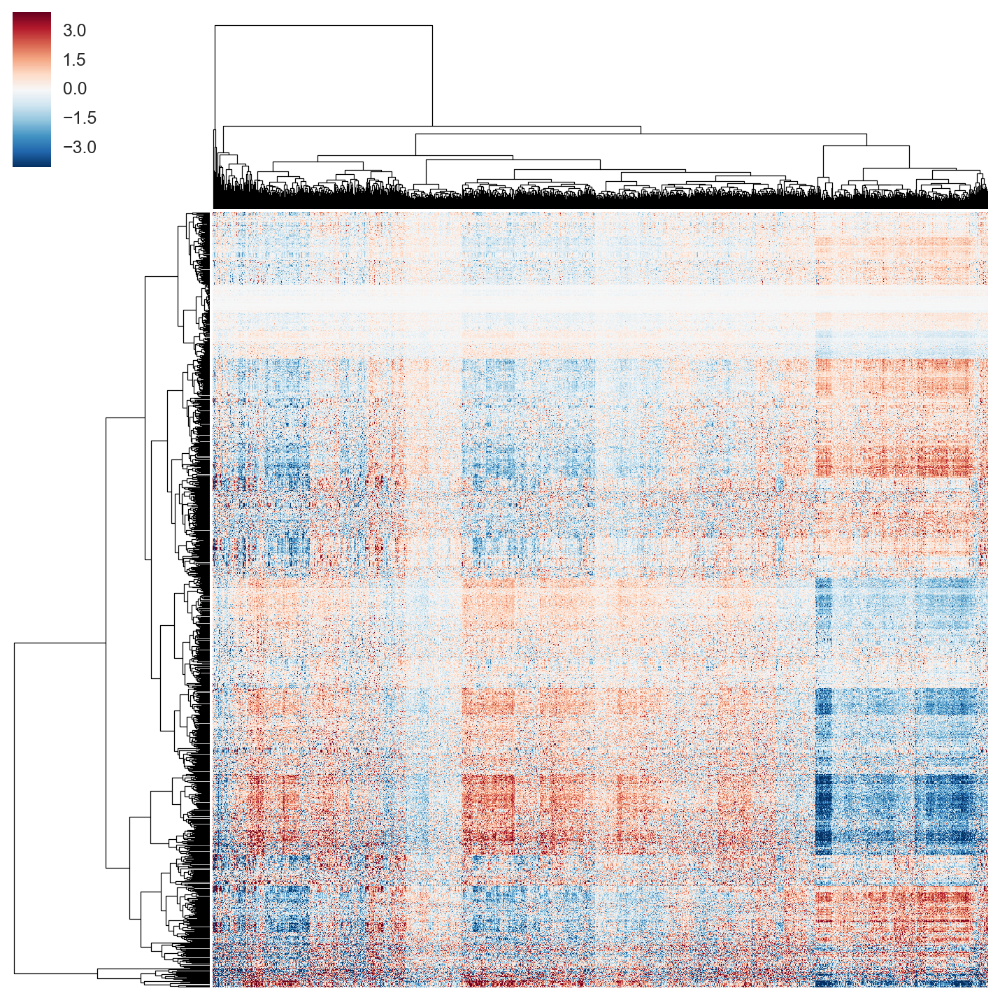

In [15]:
col_colors = sns.palplot(sns.color_palette("hls", 14))
clusterfig3 = sns.clustermap(total_drug_df, linewidths=0,col_colors=col_colors, vmax=4,z_score=0,yticklabels=plot_index, vmin=-4, xticklabels=False);

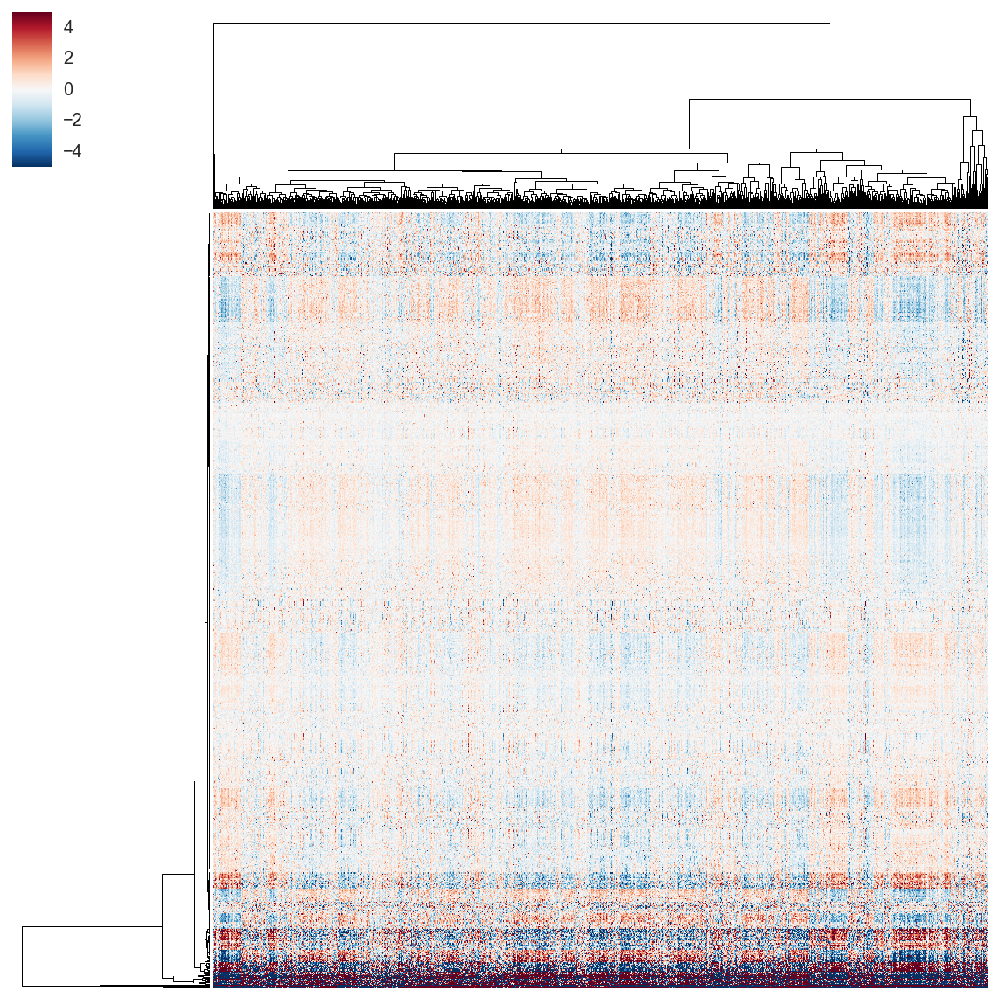

In [283]:
sns.clustermap(total_drug_df, linewidths=0,yticklabels=False,vmax=5,vmin=-5, xticklabels=False);

In [252]:
count_dic

{'A': 94,
 'B': 14,
 'C': 126,
 'D': 43,
 'G': 40,
 'H': 7,
 'J': 79,
 'L': 79,
 'M': 39,
 'N': 142,
 'P': 22,
 'R': 51,
 'S': 24,
 'V': 15}

In [265]:
#color matcher
atc_val_list = set(drug_to_atc_dic.values())
atc_val_list = sorted(atc_val_list)

#atc_color = {}
#for i, item in enumerate(atc_val_list):
#    atc_color[item] = i

atc_color_manual = {}
atc_color['A'] = 0 
atc_color['B'] = 3
atc_color['C'] = 2
atc_color['D'] = 1
atc_color['G'] = 7
atc_color['H'] = 5
atc_color['J'] = 9
atc_color['L'] = 11
atc_color['M'] = 10
atc_color['N'] = 4 
atc_color['P'] = 13
atc_color['R'] = 12
atc_color['S'] = 6
atc_color['V'] = 8



color_dict = {}

row_colors = sns.hls_palette(14,l=.6,s=.9)

for element in total_drug_df.index:
    temp_atc = drug_to_atc_dic[element][:1]
    temp_color = atc_color[temp_atc]
    color_dict[element] = row_colors[temp_color]

In [251]:
atc_val_list

['A', 'B', 'C', 'D', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'V']

In [243]:
atc_val_list

['A01',
 'A02',
 'A03',
 'A04',
 'A05',
 'A06',
 'A07',
 'A08',
 'A10',
 'A11',
 'A14',
 'A16',
 'B01',
 'B02',
 'B05',
 'C01',
 'C02',
 'C03',
 'C04',
 'C05',
 'C07',
 'C08',
 'C09',
 'C10',
 'D01',
 'D04',
 'D05',
 'D06',
 'D07',
 'D08',
 'D10',
 'D11',
 'G01',
 'G02',
 'G03',
 'G04',
 'H02',
 'H03',
 'H05',
 'J01',
 'J02',
 'J04',
 'J05',
 'L01',
 'L02',
 'L03',
 'L04',
 'M01',
 'M02',
 'M03',
 'M04',
 'M05',
 'M09',
 'N01',
 'N02',
 'N03',
 'N04',
 'N05',
 'N06',
 'N07',
 'P01',
 'P02',
 'R01',
 'R03',
 'R05',
 'R06',
 'R07',
 'S01',
 'S02',
 'V03',
 'V04',
 'V08',
 'V09']

In [246]:
#drug_to_atc_dic['DB00091']
atc_color['C01']
sns.palplot(row_colors[53])

IndexError: list index out of range

In [223]:
color_dict

{'DB00014': (0.33999999999999997, 0.50825205479452051, 0.86),
 'DB00091': (0.33999999999999997, 0.42277260273972594, 0.86),
 'DB00121': (0.86, 0.75585753424657531, 0.33999999999999997),
 'DB00130': (0.86, 0.84133698630136988, 0.33999999999999997),
 'DB00136': (0.86, 0.75585753424657531, 0.33999999999999997),
 'DB00140': (0.86, 0.75585753424657531, 0.33999999999999997),
 'DB00146': (0.86, 0.75585753424657531, 0.33999999999999997),
 'DB00150': (0.77010410958904107, 0.33999999999999997, 0.86),
 'DB00159': (0.36578630136986295, 0.86, 0.33999999999999997),
 'DB00162': (0.86, 0.75585753424657531, 0.33999999999999997),
 'DB00163': (0.86, 0.75585753424657531, 0.33999999999999997),
 'DB00170': (0.79318356164383563, 0.86, 0.33999999999999997),
 'DB00175': (0.36578630136986295, 0.86, 0.33999999999999997),
 'DB00176': (0.77010410958904107, 0.33999999999999997, 0.86),
 'DB00177': (0.40852602739726007, 0.86, 0.33999999999999997),
 'DB00178': (0.40852602739726007, 0.86, 0.33999999999999997),
 'DB0018

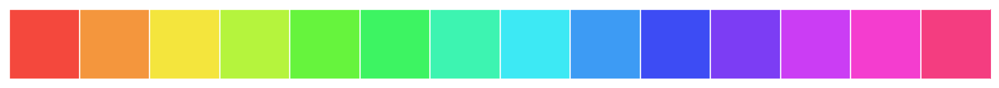

In [262]:
row_colors = sns.hls_palette(14,l=.6,s=.9)
sns.palplot(row_colors)

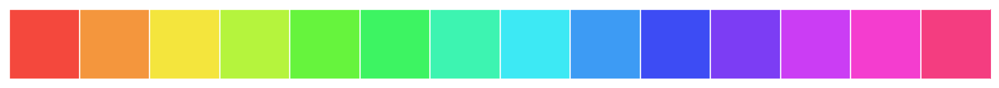

In [260]:
sns.palplot(sns.hls_palette(14,l=.6,s=.9))

In [238]:
count_dic = {}
for element in drug_to_atc_dic:
    categ = drug_to_atc_dic[element][:1]
    try:
        count_dic[categ] += 1
    except:
        count_dic[categ] = 1
count_dic

{'A': 94,
 'B': 14,
 'C': 126,
 'D': 43,
 'G': 40,
 'H': 7,
 'J': 79,
 'L': 79,
 'M': 39,
 'N': 142,
 'P': 22,
 'R': 51,
 'S': 24,
 'V': 15}

In [266]:
color_series = pd.Series(color_dict)

In [227]:
color_series

TypeError: 'numpy.ndarray' object is not callable

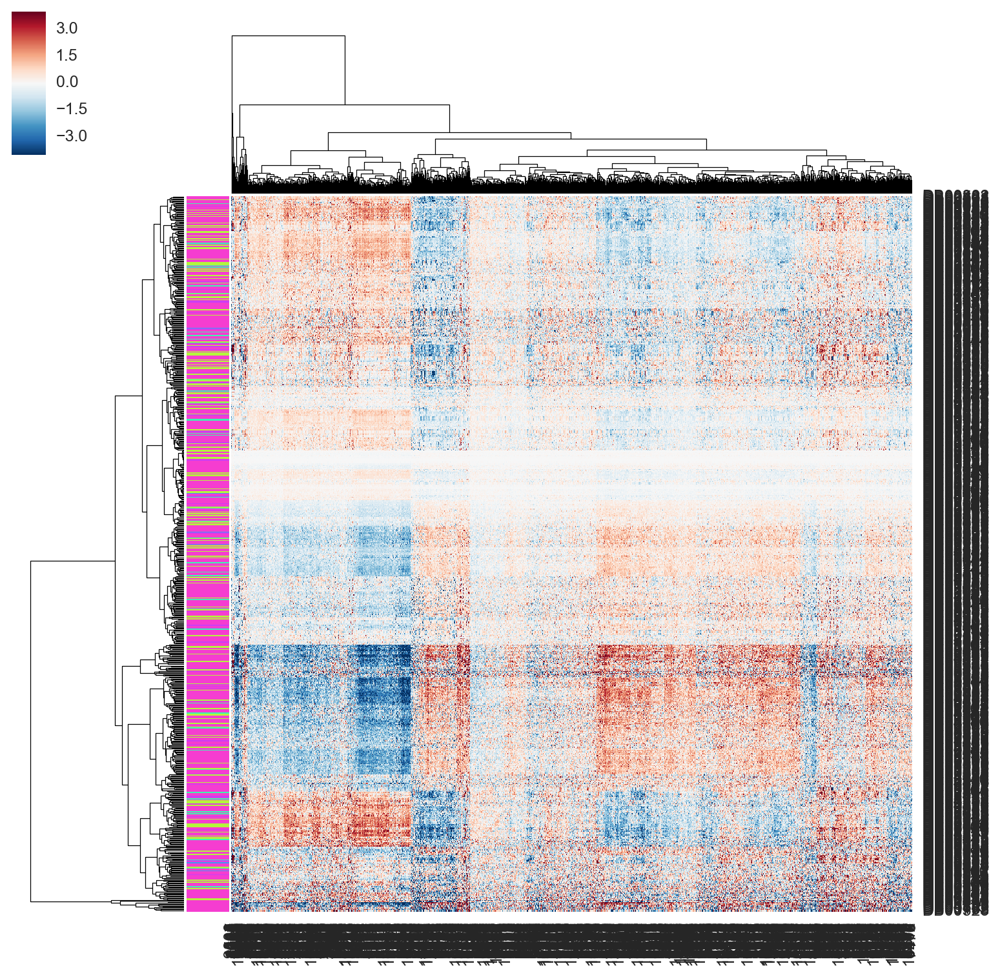

In [267]:
clusterfig4 = sns.clustermap(total_drug_df, linewidths=0, row_colors=color_series, vmax=4,z_score=0, vmin=-4);